<div style="text-align: center;">
  <img src="https://media.licdn.com/dms/image/D4D22AQFukgPXJBhXTg/feedshare-shrink_2048_1536/0/1689439105962?e=2147483647&v=beta&t=JaB3YkuMV0dP8F-HG8O_ifuYAOnwYTwWyr6Zl030Jjc" width="300" style="display: inline-block;">
  <img src="https://programmerhumor.io/wp-content/uploads/2024/01/programmerhumor-io-java-memes-javascript-memes-602afdfb8d17c96-608x609.jpg" width="650" style="display: inline-block;">
</div>

# Agenda


### **Tensorflow Keras-1**
- Business-case introduction - Healthyfi.me
- Basic EDA
- Tensorflow documentation overview
- tf.keras overview
- Keras Sequential API
- Dense Layer
  1. Input shape
  2. Activation function
      - Binary classification
  3. Custom layer name
    - Sequential classification model
    - Multi target output
- Methods for sequential model
  - model.add
  - model.weights
  - model.summary
  - number of parameters
- Parameter Initialisation
- Model Compilation
  1.   Loss
        - Type of loss
  2.   Optimiser
  3.   Metrics
        - Logistic regression model

- Model Training
  1. X_train, y_train
  2. epochs
  3. batch_size
  4. validation_split
  5. validation_data
- history
  1. verbose
  2. history object attributes
  3. Loss and Accuracy Curve

### **Tensorflow and Keras-2**

- Keras Functional API
  1. Why Functional API
  2. Keras Functional Model Class
    - Functional model
    - Model summary
    - Model Hyperparameter
- prediction and evaluation
  1. model.evaluate
  2. model.predict
    - Model prediction
    - Binary classifier
    - What's the price?
- Callbacks
  1. Why do we need a callback?
  2. Custom callback
  3. Standard callbacks and their purpose
    - Adding callbacks
    - Callbacks in tensorflow
    - Customized loss function
    - Avoid overfitting
- Tensorboard
  1.  CallBack
  2. Dashboard

# Let's Begin by Importing libraries and downloading Datasets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

!wget "https://drive.google.com/uc?export=download&id=1GVhrh2rH6hUunV4Tf7lQoSFsqov9aPjU" -O healthyfime.csv

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [6]:
df = pd.read_csv("healthyfime_tfkeras.csv")
df.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


# EDA

In [7]:
df.replace({"M":0, "F":1} , inplace = True)
df.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [8]:
classes = list(df['class'].unique())

mapping_dict = { ch : i for i, ch in enumerate(sorted(classes, reverse=True)) }
print (mapping_dict)
df['class'].replace(mapping_dict , inplace = True)
df.head()

{'D': 0, 'C': 1, 'B': 2, 'A': 3}


,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,1
1,25.0,0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,3
2,31.0,0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,1
3,32.0,0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,2
4,28.0,0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,2


# Let's create dataset

In [9]:
X, y = df.iloc[:, :-1], df.iloc[:, -1]
print(X.shape, y.shape)

(13393, 11) (13393,)


In [10]:
from sklearn.model_selection import train_test_split

X_dev, X_test, y_dev, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_dev, y_dev, test_size=0.1, random_state=42) # 10% of 90% as my validation data
# X-train would be 90% of 90% of my total dataset

# 90% 5% 5%.
print('Train : ', X_train.shape, y_train.shape)
print('Valid : ', X_val.shape, y_val.shape)
print('Test  : ', X_test.shape, y_test.shape)

# People perform hyper-parameter tuning on test-data,
# you also want the model to generalize, you test that part with validation dataset


Train :  (10847, 11) (10847,)
Valid :  (1206, 11) (1206,)
Test  :  (1340, 11) (1340,)


<Axes: >

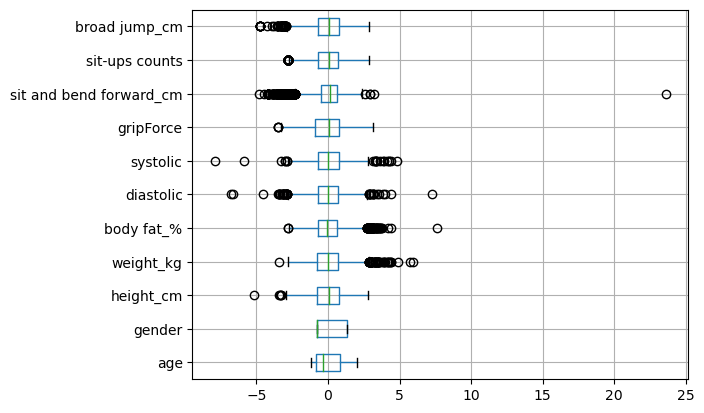

In [11]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train,y_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

pd.DataFrame(X_train,columns=df.columns[:-1]).boxplot(rot = 0, vert=False)

# not just for NN, but also for CN, RNN, LSTM, transformers

# Let's create model

In [12]:
import tensorflow as tf

## Keras Sequential API

In [13]:
X_train.shape

(10847, 11)

In [14]:
# create a 4 layer neural network, with 256, 128, 64, 4 softmax

from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import SGD


model = Sequential([
Dense(256, activation='relu', input_shape=(X_train.shape[1],)), # simple dense layer with 64 units,
Dense(128, activation='relu'),
Dense(64, activation='relu'),
Dense(4, activation='softmax')
])


model.compile(optimizer=SGD(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.summary()




Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               3072      
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 4)                 260       
                                                                 
Total params: 44484 (173.77 KB)
Trainable params: 44484 (173.77 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [15]:
model.fit(X_train, y_train, epochs=10, batch_size=256, validation_split=0.1)

Epoch 1/10


39/39 [==============================] - 1s 6ms/step - loss: 1.3769 - accuracy: 0.2828 - val_loss: 1.3590 - val_accuracy: 0.3217
Epoch 2/10
39/39 [==============================] - 0s 2ms/step - loss: 1.3405 - accuracy: 0.3942 - val_loss: 1.3252 - val_accuracy: 0.4166
Epoch 3/10
39/39 [==============================] - 0s 2ms/step - loss: 1.3067 - accuracy: 0.4457 - val_loss: 1.2925 - val_accuracy: 0.4452
Epoch 4/10
39/39 [==============================] - 0s 2ms/step - loss: 1.2723 - accuracy: 0.4658 - val_loss: 1.2578 - val_accuracy: 0.4608
Epoch 5/10
39/39 [==============================] - 0s 3ms/step - loss: 1.2351 - accuracy: 0.4783 - val_loss: 1.2197 - val_accuracy: 0.4756
Epoch 6/10
39/39 [==============================] - 0s 2ms/step - loss: 1.1948 - accuracy: 0.4927 - val_loss: 1.1795 - val_accuracy: 0.4774
Epoch 7/10
39/39 [==============================] - 0s 2ms/step - loss: 1.1540 - accuracy: 0.5067 - val_loss: 1.1397 - val_accuracy: 0.4940
Epoch 8/10
39/39 [

## Keras Functional API

In [17]:
inputs = Input(shape=(X_train.shape[1], ))

# Let's define the layers

layer1 = Dense(256, activation='relu')(inputs)
layer2 = Dense(128, activation='relu')(layer1)
layer3 = Dense(64, activation='relu')(layer2)
output_layer = Dense(4, activation='softmax')(layer3)

model_func = Model(inputs=inputs, outputs=output_layer)

model_func.compile(optimizer=SGD(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model_func.summary()



Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 11)]              0         
                                                                 
 dense_4 (Dense)             (None, 256)               3072      
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 4)                 260       
                                                                 
Total params: 44484 (173.77 KB)
Trainable params: 44484 (173.77 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


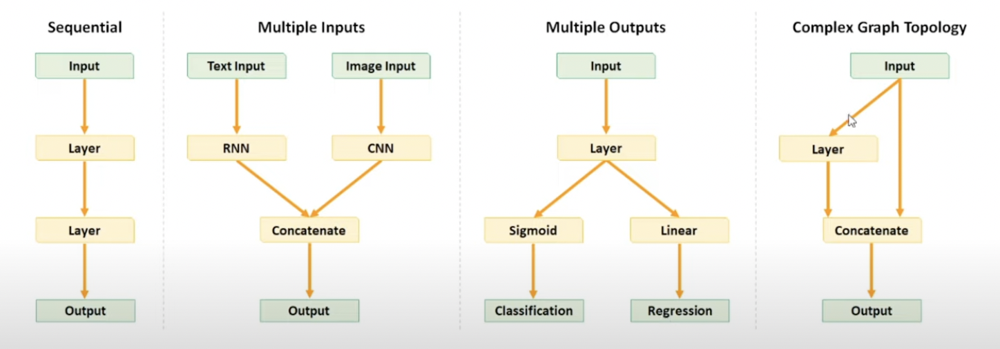

In [18]:
# inputs1 = no of rooms
# inputs2 = image of the house

# ouptut = price of the house

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Conv2D, Flatten, concatenate
from tensorflow.keras.models import Model

# Define two sets of inputs
numerical_input = Input(shape=(10,), name='numerical_data')  # Example for 10 numerical features, this is not a neural network layer
# this is me just specifying just the input shape
image_input = Input(shape=(64, 64, 3), name='image_data')    # Example for 64x64 RGB images

# Branch for numerical data
num_dense1 = Dense(16, activation='relu')(numerical_input)
num_dense2 = Dense(8, activation='relu')(num_dense1)

# Branch for image data
conv1 = Conv2D(32, (3, 3), activation='relu')(image_input)
flattened = Flatten()(conv1)

# Merge branches
merged = concatenate([num_dense2, flattened])

# Output layer
output = Dense(1, name='output')(merged)  # For regression (e.g., house price prediction)

# Define the model
model = Model(inputs=[numerical_input, image_input], outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Summary of the model
model.summary()

# Assuming some dummy data
import numpy as np

# Generate dummy numerical data
num_samples = 1000
numerical_data = np.random.random((num_samples, 10))

# Generate dummy image data
image_data = np.random.random((num_samples, 64, 64, 3))

# Generate dummy target values (house prices)
targets = np.random.random((num_samples, 1))

# Train the model
model.fit([numerical_data, image_data], targets, epochs=10)



Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 numerical_data (InputLayer  [(None, 10)]                 0         []                            
 )                                                                                                
                                                                                                  
 image_data (InputLayer)     [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 dense_8 (Dense)             (None, 16)                   176       ['numerical_data[0][0]']      
                                                                                                  
 conv2d (Conv2D)             (None, 62, 62, 32)           896       ['image_data[0][0]']   

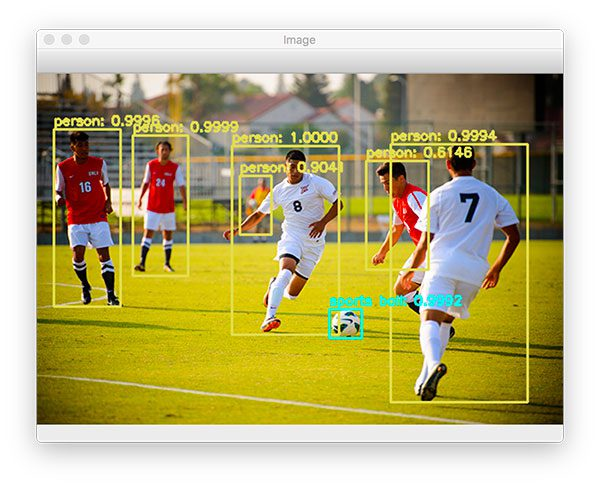

In [19]:
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model

# Define the input shape
input_shape = (64, 64, 3) # for example, 64x64 RGB images

# Input layer
inputs = Input(shape=input_shape)

# Convolutional layers
x = Conv2D(32, (3, 3), activation='relu')(inputs)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)

# Branch 1: Output for classification
output1 = Dense(10, activation='softmax', name='category_output')(x) # Assuming 10 categories

# Branch 2: Output for bounding box regression
output2 = Dense(4, activation='linear', name='bbox_output')(x) # 4 coordinates for the bounding box

# Create the model with inputs and outputs
model = Model(inputs=inputs, outputs=[output1, output2])

# Compile the model
# You must specify the loss and metrics for each output
model.compile(optimizer='adam',
              loss={'category_output': 'categorical_crossentropy',
                    'bbox_output': 'mse'},
              metrics={'category_output': ['accuracy'],
                       'bbox_output': ['mae']})

# Summary of the model
model.summary()



Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_1 (Conv2D)           (None, 62, 62, 32)           896       ['input_2[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 31, 31, 32)           0         ['conv2d_1[0][0]']            
 D)                                                                                               
                                                                                                  
 conv2d_2 (Conv2D)           (None, 29, 29, 64)           18496     ['max_pooling2d[0][0]']

# Model Evaluation

In [20]:
inputs = Input(shape=(X_train.shape[1], ))

# Let's define the layers

layer1 = Dense(256, activation='relu')(inputs)
layer2 = Dense(128, activation='relu')(layer1)
layer3 = Dense(64, activation='relu')(layer2)
output_layer = Dense(4, activation='softmax')(layer3)

model_func = Model(inputs=inputs, outputs=output_layer)

model_func.compile(optimizer=SGD(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model_func.fit(X_train, y_train, epochs=10, batch_size=256, validation_split=0.1)

Epoch 1/10
39/39 [==============================] - 0s 5ms/step - loss: 1.3856 - accuracy: 0.2643 - val_loss: 1.3568 - val_accuracy: 0.3171
Epoch 2/10
39/39 [==============================] - 0s 3ms/step - loss: 1.3343 - accuracy: 0.3979 - val_loss: 1.3103 - val_accuracy: 0.4525
Epoch 3/10
39/39 [==============================] - 0s 2ms/step - loss: 1.2877 - accuracy: 0.4628 - val_loss: 1.2655 - val_accuracy: 0.4691
Epoch 4/10
39/39 [==============================] - 0s 2ms/step - loss: 1.2422 - accuracy: 0.4856 - val_loss: 1.2215 - val_accuracy: 0.4802
Epoch 5/10
39/39 [==============================] - 0s 2ms/step - loss: 1.1980 - accuracy: 0.4931 - val_loss: 1.1790 - val_accuracy: 0.4839
Epoch 6/10
39/39 [==============================] - 0s 2ms/step - loss: 1.1562 - accuracy: 0.5038 - val_loss: 1.1396 - val_accuracy: 0.4931
Epoch 7/10
39/39 [==============================] - 0s 2ms/step - loss: 1.1181 - accuracy: 0.5142 - val_loss: 1.1043 - val_accuracy: 0.5088
Epoch 8/10
39/39 [==

In [21]:
loss, accuracy = model_func.evaluate(X_test, y_test)

print('Test Set')
print("Loss value : ", loss)
print("Accuracy   : ", accuracy)

42/42 [==============================] - 0s 1ms/step - loss: 0.9918 - accuracy: 0.5813
Test Set
Loss value :  0.991844892501831
Accuracy   :  0.5813432931900024


In [22]:
pred = model_func.predict(X_test)

np.sum(pred, axis=1)

42/42 [==============================] - 0s 829us/step


array([0.99999994, 1.        , 1.0000001 , ..., 1.        , 0.99999994,
       1.0000001 ], dtype=float32)

In [23]:
from sklearn.metrics import accuracy_score
import numpy as np

acc_score = accuracy_score(y_test, np.argmax(pred, axis = 1))

print("Test acc: ", acc_score)

Test acc:  0.5813432835820895


# Callbacks

* It allows you to monitor, observe, and act up on your model training (while training)

In [50]:
# how to use EarlyStopping
inputs = Input(shape=(X_train.shape[1], ))

# Let's define the layers

layer1 = Dense(256, activation='relu')(inputs)
layer2 = Dense(128, activation='relu')(layer1)
layer3 = Dense(64, activation='relu')(layer2)
output_layer = Dense(4, activation='softmax')(layer3)

model_func = Model(inputs=inputs, outputs=output_layer)

model_func.compile(optimizer=SGD(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])



from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, mode='min') # default is auto
# if for top 10 epochs consistently your val_accuracy isn't increasing, stop training.

checkpoint = ModelCheckpoint(filepath='model.h5', save_best_only=True, verbose=1, monitor='val_accuracy', mode='max')




model_func.fit(X_train, y_train, epochs=10, batch_size=256, validation_split=0.1, callbacks=[early_stopping, checkpoint])

Epoch 1/10
30/39 [======================>.......] - ETA: 0s - loss: 1.3827 - accuracy: 0.2796
Epoch 1: val_accuracy improved from -inf to 0.31797, saving model to model.h5
39/39 [==============================] - 2s 14ms/step - loss: 1.3773 - accuracy: 0.2863 - val_loss: 1.3524 - val_accuracy: 0.3180
Epoch 2/10
24/39 [=================>............] - ETA: 0s - loss: 1.3293 - accuracy: 0.3711

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


35/39 [=========================>....] - ETA: 0s - loss: 1.3260 - accuracy: 0.3771
Epoch 2: val_accuracy improved from 0.31797 to 0.38986, saving model to model.h5
39/39 [==============================] - 0s 7ms/step - loss: 1.3248 - accuracy: 0.3802 - val_loss: 1.3060 - val_accuracy: 0.3899
Epoch 3/10
33/39 [========================>.....] - ETA: 0s - loss: 1.2829 - accuracy: 0.4538
Epoch 3: val_accuracy improved from 0.38986 to 0.44516, saving model to model.h5
39/39 [==============================] - 0s 7ms/step - loss: 1.2786 - accuracy: 0.4577 - val_loss: 1.2624 - val_accuracy: 0.4452
Epoch 4/10
35/39 [=========================>....] - ETA: 0s - loss: 1.2358 - accuracy: 0.4876
Epoch 4: val_accuracy improved from 0.44516 to 0.47189, saving model to model.h5
39/39 [==============================] - 0s 7ms/step - loss: 1.2343 - accuracy: 0.4866 - val_loss: 1.2191 - val_accuracy: 0.4719
Epoch 5/10
34/39 [=========================>....] - ETA: 0s - loss: 1.1944 - accuracy: 0.4992
Epoch

In [ ]:
# in early stopping, it has patience for 5 epochs, but in those 5 epochs that my model trained extra, it overfitted
# little bit, this problem is solved by checkpoint.

In [55]:
from tensorflow.keras.saving import load_model


model = load_model('model.h5') # .hdf5

In [56]:
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 11)]              0         
                                                                 
 dense_40 (Dense)            (None, 256)               3072      
                                                                 
 dense_41 (Dense)            (None, 128)               32896     
                                                                 
 dense_42 (Dense)            (None, 64)                8256      
                                                                 
 dense_43 (Dense)            (None, 4)                 260       
                                                                 
Total params: 44484 (173.77 KB)
Trainable params: 44484 (173.77 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [57]:
class TrainingCallback(tf.keras.callbacks.Callback):
  # last_accuracy

  def on_train_begin(self, logs=None):
      print("Starting training...")

  def on_epoch_begin(self, epoch, logs=None):
      print(f"Starting epoch {epoch}")

  def on_train_batch_begin(self, batch, logs=None):
      print(f"Training: Starting batch {batch}")

  def on_train_batch_end(self, batch, logs=None):
      print(f"Training: Finished batch {batch}, loss is {logs['loss']}")

  def on_epoch_end(self, epoch, logs=None):
      print(f"Finished epoch {epoch}, loss is {logs['loss']}, accuracy is {logs['accuracy']}")

  def on_tringain_end(self, logs=None):
      print("Finished train")



model_func.fit(X_train, y_train, epochs=1, batch_size=256, validation_split=0.1, callbacks=[TrainingCallback()])

Starting training...
Starting epoch 0
Training: Starting batch 0
Training: Finished batch 0, loss is 0.9984244704246521
 1/39 [..............................] - ETA: 0s - loss: 0.9984 - accuracy: 0.5625Training: Starting batch 1
Training: Finished batch 1, loss is 1.0012032985687256
Training: Starting batch 2
Training: Finished batch 2, loss is 0.9995573163032532
Training: Starting batch 3
Training: Finished batch 3, loss is 0.9979119300842285
Training: Starting batch 4
Training: Finished batch 4, loss is 1.0087494850158691
Training: Starting batch 5
Training: Finished batch 5, loss is 1.0065028667449951
Training: Starting batch 6
Training: Finished batch 6, loss is 1.0026885271072388
Training: Starting batch 7
Training: Finished batch 7, loss is 0.9993151426315308
Training: Starting batch 8
Training: Finished batch 8, loss is 1.004915475845337
Training: Starting batch 9
Training: Finished batch 9, loss is 1.0041145086288452
Training: Starting batch 10
Training: Finished batch 10, loss

# TensorBoard

In [58]:
!pip install tensorboard

In [59]:
%load_ext tensorboard


In [63]:
log_folder = 'logs'

from tensorflow.keras.callbacks import TensorBoard

tb_callback = TensorBoard(log_dir=log_folder, histogram_freq=1)

model_func.fit(X_train, y_train, epochs=20, batch_size=256, validation_split=0.1, callbacks=[tb_callback])

Epoch 1/20
39/39 [==============================] - 0s 9ms/step - loss: 0.9716 - accuracy: 0.5832 - val_loss: 0.9732 - val_accuracy: 0.5668
Epoch 2/20
39/39 [==============================] - 0s 6ms/step - loss: 0.9545 - accuracy: 0.5881 - val_loss: 0.9565 - val_accuracy: 0.5770
Epoch 3/20
39/39 [==============================] - 0s 12ms/step - loss: 0.9394 - accuracy: 0.5939 - val_loss: 0.9436 - val_accuracy: 0.5779
Epoch 4/20
39/39 [==============================] - 1s 13ms/step - loss: 0.9264 - accuracy: 0.5959 - val_loss: 0.9317 - val_accuracy: 0.5935
Epoch 5/20
39/39 [==============================] - 0s 12ms/step - loss: 0.9153 - accuracy: 0.6009 - val_loss: 0.9210 - val_accuracy: 0.5945
Epoch 6/20
39/39 [==============================] - 0s 8ms/step - loss: 0.9057 - accuracy: 0.6021 - val_loss: 0.9119 - val_accuracy: 0.6065
Epoch 7/20
39/39 [==============================] - 0s 6ms/step - loss: 0.8972 - accuracy: 0.6066 - val_loss: 0.9052 - val_accuracy: 0.6065
Epoch 8/20
39/39 

In [64]:
%tensorboard --logdir={log_folder}

<IPython.core.display.Javascript object>